# Plus proches voisins
## Complexité
La compléxité de la calculation est en $O(N)$. Il n'y a pas de phase d'apprentissage à proprement parlé, ce qui fait que sont coût est nul.
## Taille mémoire
Pour cet algo faut garder en mémoire tous les $X_{i}$, donc $N\times d$.
Cependant pour le perceptron on n'a qu'a garder les $d$ coordonnées du vecteur de poid $w$. Le cout de la classification est celui du produit scalaire entre $w$ et $x$, il est unitaire.

In [2]:
import numpy as np
import random as rd
import math
import seaborn as sns
sns.set(style="darkgrid")

def dist(i,x):
    return math.sqrt(np.sum(np.array([(x[j]-i[j])**2 for j in range(len(i))])))
def NearestNeighbor(x,X,y):
    (NN,d_min) = 0,1000000000
    for i in range(len(X)):
        d = dist(X[i],x)
        if(d<d_min):
            NN=i
            d_min = d
    return y[NN]
def split(X,y,per = 0.8):
    Xtr,ytr,Xte,yte = [],[],[],[]
    for i in range(len(y)):
        if(rd.random() < per):
            Xtr.append(X[i,:])
            ytr.append(y[i])
        else:
            Xte.append(X[i,:])
            yte.append(y[i])
    return np.array(Xtr),np.array(ytr),np.array(Xte),np.array(yte)

In [3]:
n=1000
data0 = np.random.randn(n, 2) + 1
data1 = np.random.randn(n, 2) - 1
labels0 = np.ones(n)
labels1 = -np.ones(n)
X = np.concatenate([data0, data1])
y = np.concatenate([labels0, labels1])

In [4]:
Xtr,ytr,Xte,yte = split(X,y)

In [5]:
def accuracy(truth, output):
    n = len(truth)
    return (truth == output).sum() / n

In [6]:
output = np.array([NearestNeighbor(i,Xtr,ytr) for i in Xte])
accuracy(yte,output)


0.8846153846153846

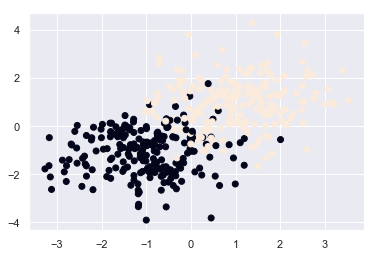

In [7]:
from matplotlib import pyplot as plt
plt.scatter(Xte[:,0],Xte[:,1],c = output)
plt.show()

In [8]:
def predict(data,X,y):
    res =[]
    for i in data:
        res.append(NearestNeighbor(i,X,y))
    return np.array(res)



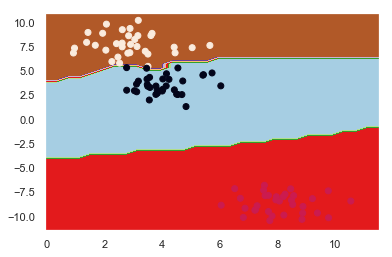

In [9]:
import numpy as np
from sklearn.datasets import make_blobs
import matplotlib.pylab as plt

X, y = make_blobs(n_samples=100, n_features=2, centers=3, cluster_std=1.0, center_box=(-10.0, 10.0))
h = .4 # Precision de la grille
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),np.arange(y_min, y_max, h)) 
data = np.c_[xx.ravel(), yy.ravel()]
# Dans le format de votre classifier
z = predict(data,X,y) 
zz = z.reshape(xx.shape)
plt.figure()
plt.contourf(xx, yy, zz, cmap=plt.cm.Paired) 
plt.axis('tight') 
plt.scatter(X[:,0],X[:,1],c=y)
#plt.savefig("figures/tp3-surface.pdf")
plt.show()

In [10]:
import bisect 
import math

def KNearestNeighborNoW(x,X,y,k):
    # compute the k NN for initialisation
    vals=[dist(X[i],x) for i in range(k+1)]
    LNN = np.sort(vals)
    index = np.argsort(vals)
    # index will keep the indexes
    # LNN will keep the data
    for xi in range(k+1,len(X)):
        # compute distance to next int in data
        d = dist(X[xi],x)
        # if the distance is lower than the furthest element
        if(d<LNN[-1]):
            # remove last element
            LNN = LNN[:-1] 
            index = index[:-1]
            to_i = LNN.searchsorted(d)
            # insert newest element
            LNN = np.insert(LNN, to_i,d) 
            index = np.insert(index,to_i,xi)
            
    return np.median(y[index])

def vote(y,w):
    prod = list(np.unique(y, return_counts=False))
    valu = [0 for i in range(len(prod))]

    for i in range(len(y)):
        valu[prod.index(y[i])]+=w[i]
    percent = valu/np.sum(valu)
    return prod[np.argmax(percent)]

def KNearestNeighbor(x,X,y,k):
    vals=[dist(X[i],x) for i in range(k+1)]
    LNN = np.sort(vals)
    index = np.argsort(vals)
    for xi in range(k+1,len(X)):
        d = dist(X[xi],x)
        if(d<LNN[-1]):
            LNN = LNN[:-1]
            index = index[:-1]
            to_i = LNN.searchsorted(d)
            LNN=np.insert(LNN, to_i,d) 
            index = np.insert(index,to_i,xi)
        w = [math.exp(-LNN[i]/sigma**2) for i in range(len(LNN))]
    return vote(y[index],w)

def Kpred(data,X,y,k):
    res =[]
    for i in data:
        res.append(round(KNearestNeighbor(i,X,y,k)))
    return np.array(res)
    
def KpredNoW(data,X,y,k):
    res =[]
    for i in data:
        res.append(round(KNearestNeighborNoW(i,X,y,k)))
    return np.array(res)
    


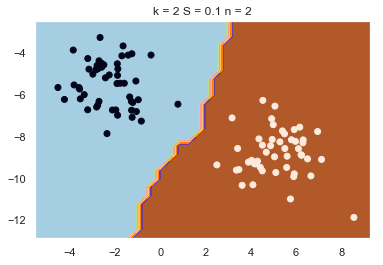

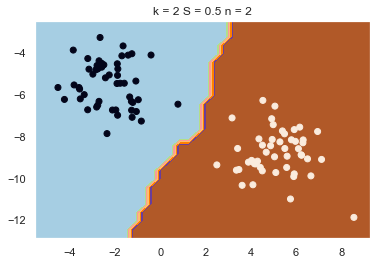

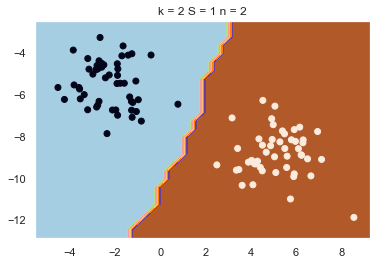

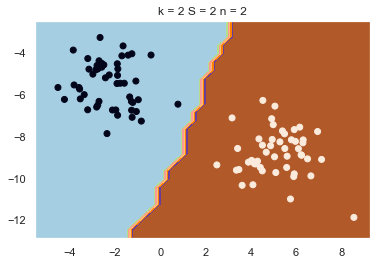

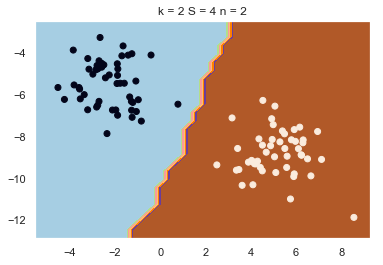

...

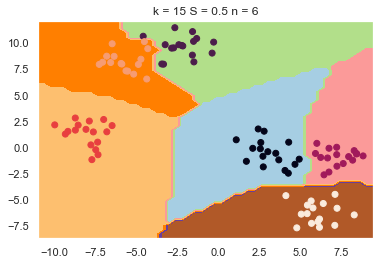

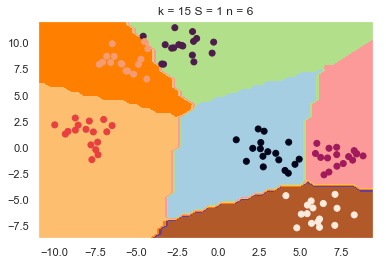

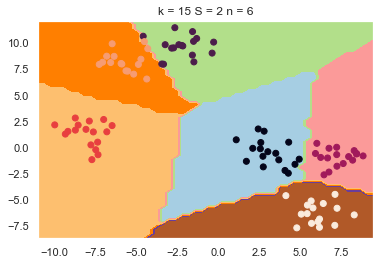

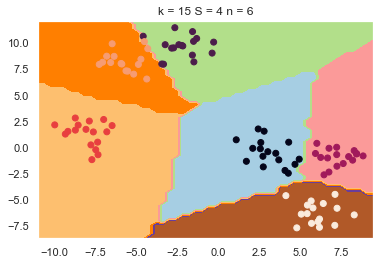

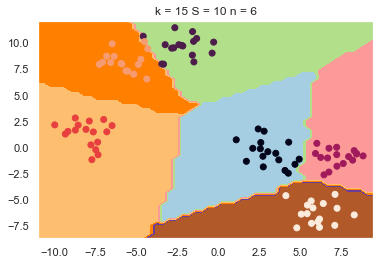

In [11]:
S = [0.1, 0.5, 1,2,4, 10]
K = [2, 3, 4, 5, 10, 15]
for n in range(2,7):
    X, y = make_blobs(n_samples=100, n_features=2, centers=n, cluster_std=1.0, center_box=(-10.0, 10.0))
    h = .4 # Precision de la grille
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),np.arange(y_min, y_max, h)) 
    data = np.c_[xx.ravel(), yy.ravel()]
    for k in K:
        for sigma in S:
            #z = KpredNoW(data,X,y,k) 
            z = Kpred(data,X,y,k)
            zz = z.reshape(xx.shape)
            plt.figure()
            plt.contourf(xx, yy, zz, cmap=plt.cm.Paired) 
            plt.axis('tight') 
            plt.scatter(X[:,0],X[:,1],c=y)
            plt.title("k = "+str(k)+" S = "+str(sigma)+" n = "+str(n))
            plt.savefig("figures/KnnWeighted"+str(n)+"-"+str(k)+"-"+str(sigma)+".png")

Pour USPC, on a vu que le perceptron a été entrainé sur toutes les classes. En effectuant une comparaison comme vu en cours "one vs all" et en renomant les différentes classes. Ici la même chose doit êter faite pour le perceptron.
Cependant ce n'est pas nécessaire au niveau des algo de KNN et NN. 